# Self Driving Car Advanced Lane Line Finder

## Objective

The objective is to detect lanes.  These lanes will have curves within them in so it's not as simple as doing some thresholding and hough lines.  The following image is the output that I will be trying to get.  I will be able to detect lanes in images and videos.

![image1](./examples/example_output.jpg)


## Overview

* Calibrate Camera (compute matrix)
* Distort corretion
* Create threshold binary image
* Apply perspective transform
* Detect lane pixels
* Detemine curvature
* Warp line boundaries to image


In [4]:
# Import packages
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


### Calibrate Camera

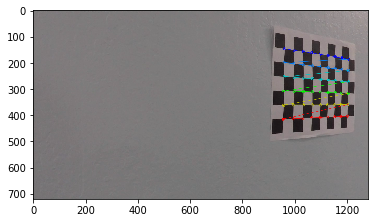

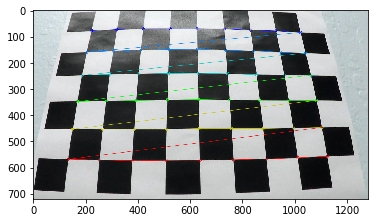

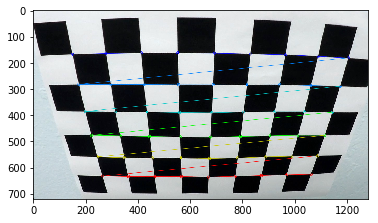

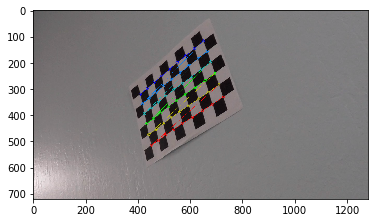

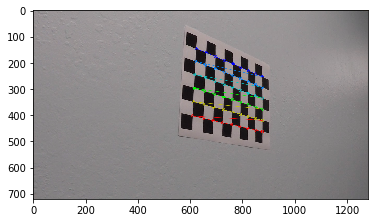

...

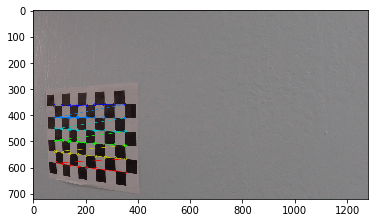

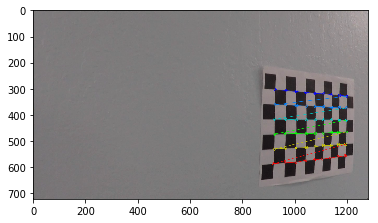

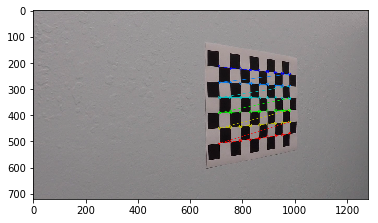

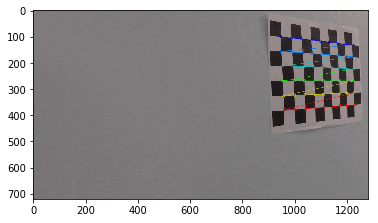

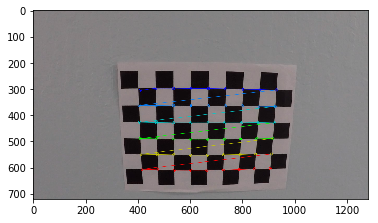

In [18]:
def calibrate_camera(img_cal_dir, nx=9, ny=6):
    
    obj_points = []
    img_points = []
    
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    for img_file in os.listdir(img_cal_dir):
        img = cv2.imread(os.path.join(img_cal_dir,img_file))
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            plt.imshow(img)
            plt.show()
            
            obj_points.append(objp)
            img_points.append(corners)
            
    if obj_points:
        return cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1], None, None)
    else:
        return (None, None, None, None, None)
            
ret, mtx, dist, rvecs, tvecs = calibrate_camera("./camera_cal")
        
    

## Undistort Images

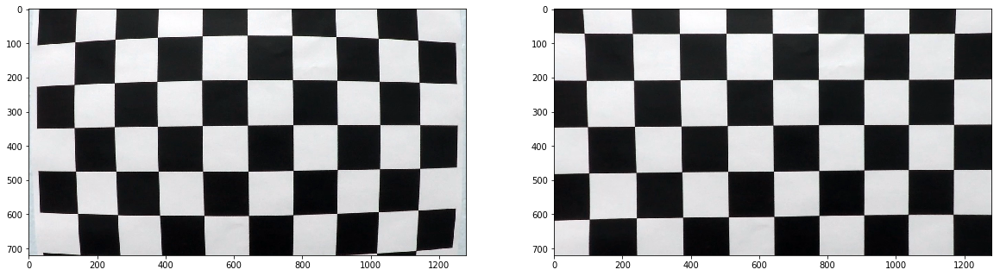

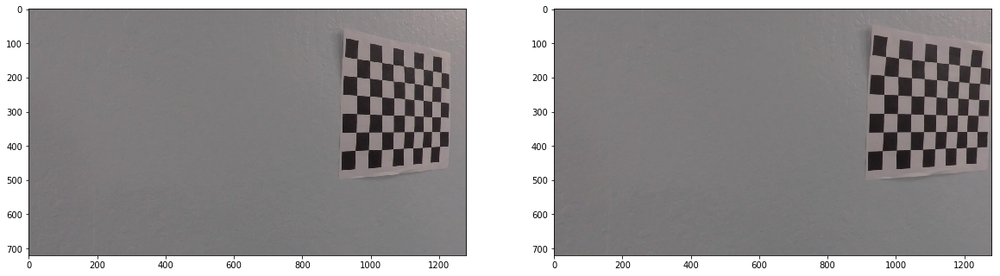

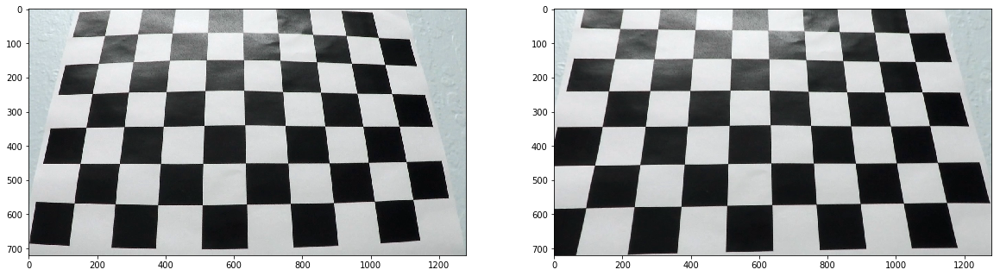

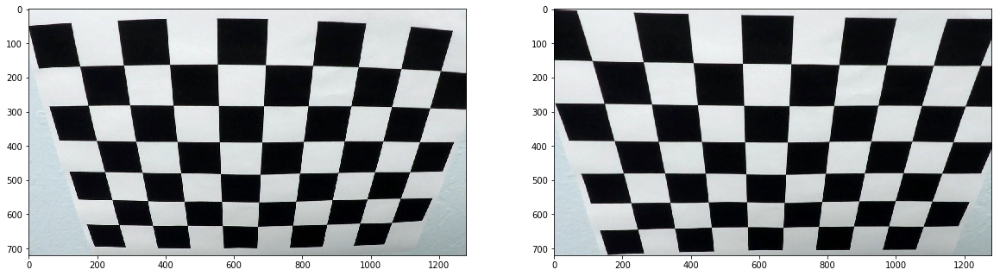

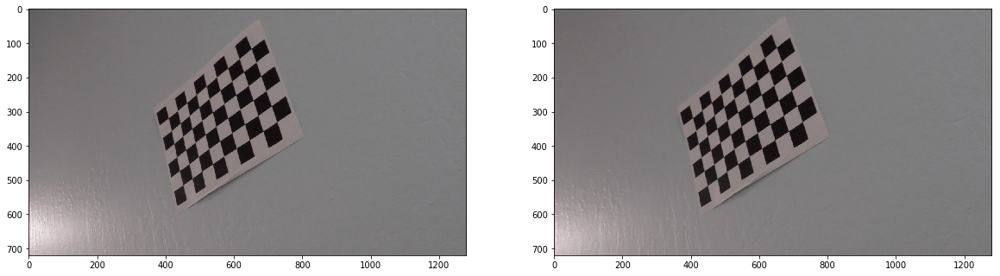

...

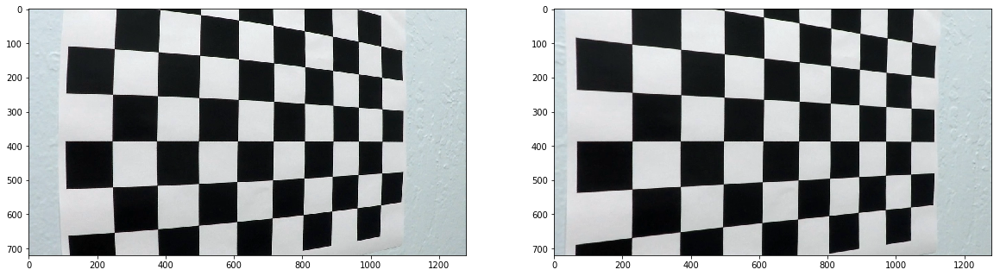

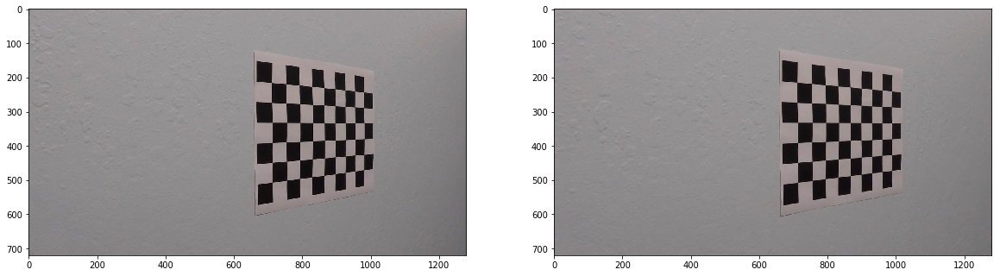

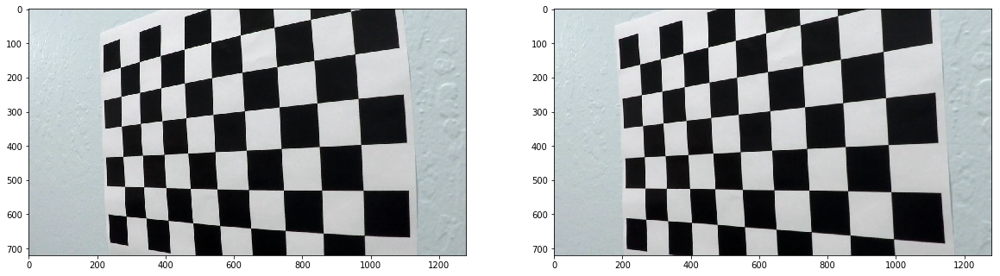

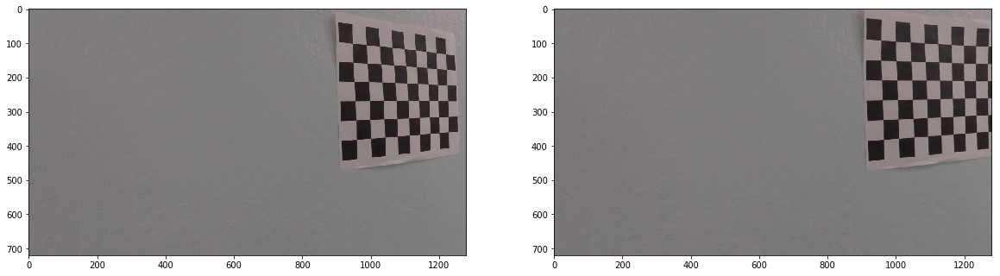

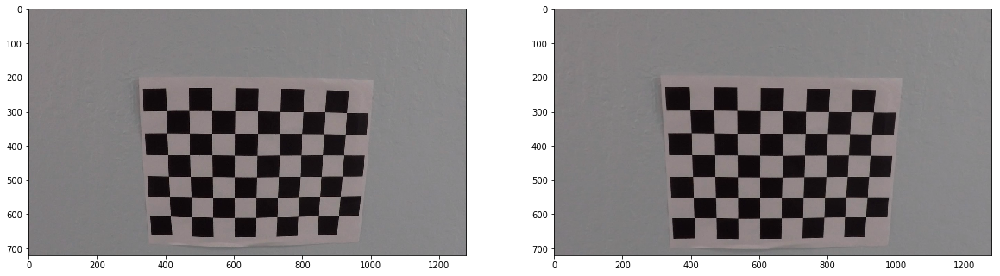

In [20]:
def test_undistort(img_path):
    for img_file in os.listdir(img_path):
        img = cv2.imread(os.path.join(img_path,img_file))
        undistorted_image = cv2.undistort(img, mtx, dist, None, mtx)
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        ax1.imshow(img)
        ax2.imshow(undistorted_image, cmap='gray')
        
test_undistort("./camera_cal")
        
        

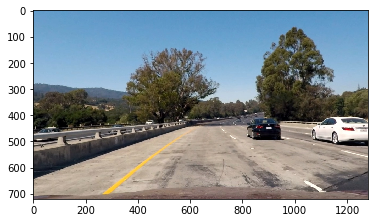

In [27]:
img = cv2.imread("./test_images/test1.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
img = cv2.undistort(img,mtx,dist,None,mtx)
plt.imshow(img)
plt.show()



In [28]:
def calculate_direction(img, kernel=9, thresh=(0, np.pi/2)):
    pass

In [ ]:
def calculate_threshold(img, thresh=(170,255)):
    pass